# Crímenes en Boston - Análisis Exploratorio de Datos (EDA)
## Introducción
El BPD (Boston Police Department) mediante un recientemente nuevo sistema de reporte de incidentes criminales ha recolectado un dataset que contiene campos de información, los cuales incluyen la posición, fecha y hora del incidente, categoría del mismo, entre otros. A continuación, se explorarán los datos, y si se requiere, se limpiarán antes de dicha exploración.
El dataset es obtenido de [este sitio](https://www.kaggle.com/AnalyzeBoston/crimes-in-boston#crime.csv), para mayor informacion visitar a [ANALYZE BOSTON](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system).

Boston es una ciudad del estado de Massachusetts en el país de Estados Unidos, la cual se encuentra en las coordenadas latitud 42.358 y longitud -71.062. Su población es de aproximadamente 620.000 habitantes (para el año de 2010).
## Información general del dataset
A continuación se expone el significado de cada columna del dataset el cual posteriormente se imprimirá, se sugiere revisarlo cada vez que sea necesario:

|Nombre de la columna |Descripción de la columna                                                  |
|---------------------|---------------------------------------------------------------------------|
| INCIDENT_NUMBER     | Número del reporte interno BDP                                            |
| OFFENSE_CODE        | Código numérico descriptor de la ofensa                                   |
| OFFENSE_CODE_GROUP  | Categorización interna de OFFENSE_DESCRIPTION                             |
| OFFENSE_DESCRIPTION | Descriptor primario del incidente                                         |
| DISTRICT            | El distrito policial al cual fue reportado el incidente                   |
| REPORTING_AREA      | Número asociado con el lugar desde donde se denunció el delito            |
| SHOOTING            | Indica si ocurrió tiroteo                                                 |
| OCURRED_ON_DATE     | Fecha y hora más temprana en el cual el incidente pudo haber tomado lugar |
| YEAR                | Año del incidente                                                         |
| MONTH               | Mes del incidente                                                         |
| DAY_OF_WEEK         | Día de la semana                                                          |
| HOUR                | Hora                                                                      |
| UCR_PART            | Número de la parte del Universal Crime Reporting (1, 2, 3)                |
| STREET              | Nombre de la calle en el cual el incidente tomó lugar                     |
| Lat                 | Latitud del incidente                                                     |
| Long                | Longitud del incidente                                                    |
| Location            | Tupla de latitud y longitud del incidente                                 |

El `UCR_PART` que representa al *Uniform Crime Reporting* (UCR) propone un sistema de clasificación de los crímenes dependiendo de cuán graves son. Este se divide en tres partes que van desde mayor a menor gravedad:
- Parte Uno: crímenes muy graves, dentro se encuentran el robo, homicidio, secuestro, asalto agravado, abuso forzoso, incendio provocado, entre otros.
- Parte Dos: crímenes serios, por ejemplo, el asalto simple (intimidación, espionaje, coerción), fraude, falsificación, posesión de bienes robados, posesión de armas de fuego, abuso de drogas, apuesta ilegal, ofensas a miembros de familia, conducir bajo efecto de drogas, entre otros.
- Parte Tres: estos no suelen clasificarse como crímenes, ofensas leves y a veces sin intenciones, estacionamiento en sitios no permitidos, entrada a sitios no autorizados sin propósito alguno, entre otros.

La columna `OFFENSE_CODE` indica el código de la ofensa o crimen, a continuación, se adjunta un [vínculo](https://www.mass.gov/service-details/masscourts-criminal-offense-codes) a una página web en la cual se puede descargar un archivo con dichos códigos y descripciones. Las columnas `OFFENSE_CODE_GROUP`, y `OFFENSE_DESCRIPTION` se derivan de la columna mencionada al inicio.

La columna `DISTRICT` indica el distrito de policías al cual fue reportado el crimen, en este sitio web [bpdnews](https://bpdnews.com/districts) se encuentran los distritos, números de teléfono, y ubicación.

## Inicializando los datos
A continuación, se importan las herramientas a emplear, de igual manera el dataset provisto previamente por el BPD, y por último, se imprime en pantalla las primeras cinco filas del dataset con el fin de indagar en la estructura de los datos.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import folium
from folium.plugins import HeatMap

# Se importa el dataset
data = pd.read_csv('crime.csv', encoding='latin-1')

# Se echa un vistazo a la estructura de los datos
data.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


## Revisión de los datos

### Conteo de los tipos de ofensas criminales

In [2]:
# Tipos de crimenes
num_off_types = len(data['OFFENSE_CODE_GROUP'].unique())
print('La cantidad de tipos de crímenes es de', num_off_types)

La cantidad de tipos de crímenes es de 67


Los tipos de crímenes como robo, asalto agravado, vandalismo, posesión de armas, estacionamiento en un sitio no permitido, etcétera, tienen una numerosa cantidad de 67 tipos.

### Columna SHOOTING

In [3]:
data.SHOOTING.unique()

array([nan, 'Y'], dtype=object)

Esto señala que la columna `SHOOTING` contiene dos valores, los valores `NaN` (not a number) que representa datos nulos, y `Y` que es la abreviación de 'Yes' indicando que en dicho incidente ocurrió un tiroteo.

### Revisión de las columnas Lat y Long

In [4]:
print('Columna Latitud',
      '\n',
      data.Lat.describe(),
      '\n' * 2,
      'Columna Longitud',
      '\n',
      data.Long.describe())

Columna Latitud 
 count    299074.000000
mean         42.214381
std           2.159766
min          -1.000000
25%          42.297442
50%          42.325538
75%          42.348624
max          42.395042
Name: Lat, dtype: float64 

 Columna Longitud 
 count    299074.000000
mean        -70.908272
std           3.493618
min         -71.178674
25%         -71.097135
50%         -71.077524
75%         -71.062467
max          -1.000000
Name: Long, dtype: float64


Se observa que, en Latitud la media es 42.21 (2 c.s.) y en Longitud es -70.91 (2 c.s.), lo cual es razonable dado que las coordenadas de Boston son (42.358, -71.062), no obstante, **el valor mínimo de la columna Latitud es de -1 y el valor máximo de la columna Longitud es de igual forma, -1**. Se hipotetiza entonces que, dicho valor corresponde a incidentes cuya ubicacion no fue registrada.

## Limpieza, simplificado y reestructurado de los datos
El análisis se enfocará en dos años del dataset cuyos datos se encuentran completos (2016 y 2017). Asimismo, se emplearán los incidentes de UCR Part One, dado que incluyen únicamente crímenes más graves.

In [5]:
# Mantener únicamente los datos de 2016 y 2017
data = data.loc[data['YEAR'].isin([2016, 2017])]

# Mantener solo los datos con ofensa UCR Part One (las más graves)
data = data.loc[data['UCR_PART'] == 'Part One']

# Remover columnas inútiles
data = data.drop(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'UCR_PART', 'Location'], axis=1)

# Transformar OCURRED_ON_DATE (string object) to datetime object
data['OCCURRED_ON_DATE'] = pd.to_datetime(data['OCCURRED_ON_DATE'])

# Rellenar los NaNs (not a number) en la columna SHOOTING
data.SHOOTING.fillna('N', inplace=True)

# Transformar DAY_OF_WEEK a una categoría ordenada
data.DAY_OF_WEEK = pd.Categorical(data.DAY_OF_WEEK, categories=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], ordered=True)

# Reemplazar valores -1 en columnas Lat y Long con NaN
data.Lat.replace(-1, None, inplace=True)
data.Long.replace(-1, None, inplace=True)

# Renombrar las columnas
rename = {'OFFENSE_CODE_GROUP': 'Group',
         'OFFENSE_DESCRIPTION': 'Description',
         'DISTRICT': 'District',
         'REPORTING_AREA': 'Area',
         'SHOOTING': 'Shooting',
         'OCCURRED_ON_DATE': 'Date',
         'YEAR': 'Year',
         'MONTH': 'Month',
         'DAY_OF_WEEK': 'Day',
         'HOUR': 'Hour',
         'STREET': 'Street'}

data.rename(index=str, columns=rename, inplace=True)

# Breve revisión del dataset actualizado
data.head()

,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,Street,Lat,Long
5633,Larceny,LARCENY THEFT FROM BUILDING,E5,729,N,2017-10-23 13:58:00,2017,10,Monday,13,VFW PKWY,42.285370,-71.172440
5919,Auto Theft,AUTO THEFT - MOTORCYCLE / SCOOTER,E18,544,N,2017-03-22 09:00:00,2017,3,Wednesday,9,AUSTIN ST,42.257688,-71.126418
6940,Residential Burglary,BURGLARY - RESIDENTIAL - NO FORCE,D14,774,N,2017-03-23 12:00:00,2017,3,Thursday,12,COMMONWEALTH AVE,42.338363,-71.154410
12370,Larceny From Motor Vehicle,LARCENY THEFT FROM MV - NON-ACCESSORY,E13,571,N,2017-11-21 21:00:00,2017,11,Tuesday,21,SYLVIA ST,42.310559,-71.102854
14227,Larceny,LARCENY THEFT FROM BUILDING,D4,136,N,2017-12-15 16:06:00,2017,12,Friday,16,MARLBOROUGH ST,42.352569,-71.079788


In [6]:
# Se verifican los tipos de datos
print(data.dtypes, '\n')

# Se hace un conteo de los datos nulos de todo el dataset
print(data.isnull().sum(), '\n')

# Se imprime la dimensión del dataset
print('La dimensión del dataset es', data.shape)

Group                  object
Description            object
District               object
Area                   object
Shooting               object
Date           datetime64[ns]
Year                    int64
Month                   int64
Day                  category
Hour                    int64
Street                 object
Lat                   float64
Long                  float64
dtype: object 

Group             0
Description       0
District        133
Area              0
Shooting          0
Date              0
Year              0
Month             0
Day               0
Hour              0
Street         1019
Lat            1733
Long           1733
dtype: int64 

La dimensión del dataset es (37538, 13)


## Visualización de crímenes graves
Se procede a visualizar la frecuencia de los tipos de crímenes. Dado que se eligió las ofensas UCR Part One, el número de tipo de crímenes se redujo a 9 de los 67 tipos que se tenía inicialmente.

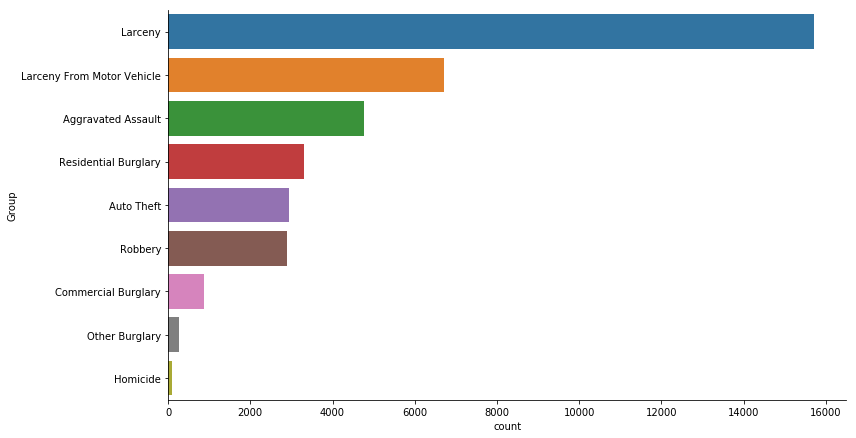

In [7]:
# Plotting de un gráfico de conteo
sns.catplot(y='Group', kind='count', height=6, aspect=2, order=data.Group.value_counts().index, data=data)

Se aprecia que `Larceny` cuya [definición](https://ucr.fbi.gov/crime-in-the-u.s/2011/crime-in-the-u.s.-2011/offense-definitions) según el FBI es "la toma, transporte, conducción o huida ilegal de bienes de la posesión o posesión constructiva de otro. Algunos ejemplos son los robos de bicicletas, piezas y accesorios de vehículos motorizados, robo en tiendas, carterismo o el robo de cualquier propiedad o artículo que no sea tomado por la fuerza, la violencia o el fraude. Intentos de robo están incluidos" es por mucho el crimen más frecuente, por el otro lado, los homicidios son muy raros.

## ¿Cuándo ocurren los crímenes más graves?
Se considerará posibles patrones respecto a distintas escalas del tiempo: horas en el día, días en el mes y meses en el año.

Text(-2.5749999999999957, 0.5, 'Frecuencia')

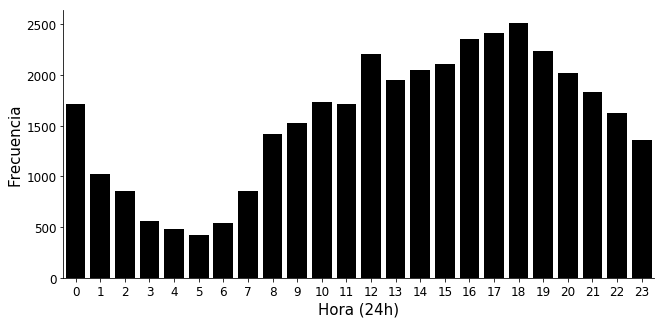

In [8]:
# Crímenes por hora del día
sns.catplot(x='Hour', kind='count', data=data, height=4.5, aspect=2, color='#000000')
plt.xticks(size=12)
plt.yticks(size=12)
plt.xlabel('Hora (24h)', fontsize=15)
plt.ylabel('Frecuencia', fontsize=15)

Se observa que, la frecuencia pico de crímenes graves ocurren a las 18:00 (6:00 p.m.). En general, los crímenes ocurren con mayor frecuencia pasando el medio día.

(5000, 6000)

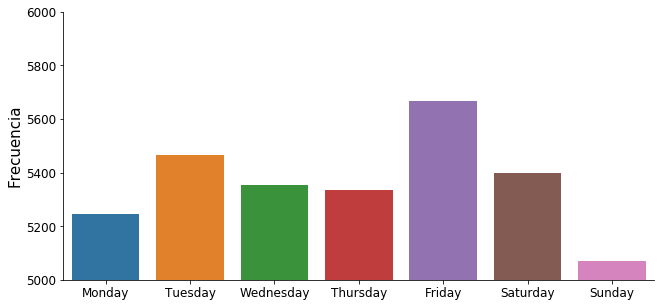

In [9]:
# Crímenes por día de la semana
sns.catplot(x='Day', kind='count', height=4.5, aspect=2, data=data)
plt.xticks(size=12)
plt.yticks(size=12)
plt.xlabel('')
plt.ylabel('Frecuencia', fontsize=15)
plt.ylim(5000, 6000)

Los días viernes indican mayor frecuencia en la ocurrencia de crímenes graves, por el otro lado, los días domingo tienen menos frecuencia.

(2000, 4000)

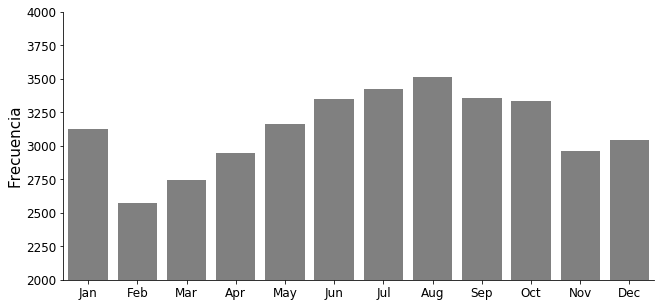

In [10]:
# Crímenes por mes del año
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
sns.catplot(x='Month', kind='count', height=4.5, aspect=2, color='gray', data=data)
plt.xticks(np.arange(12), months, size=12)
plt.yticks(size=12)
plt.xlabel('')
plt.ylabel('Frecuencia', fontsize=15)
plt.ylim(2000, 4000)

Se aprecia un crecimiento casi lineal en la frecuencia de crímenes desde febrero hasta agosto, donde este último mes posee una mayor frecuencia de crímenes graves. Febrero es el mes con menos incidentes.

Hasta ahora, se observa que la fecha y hora con **mayor incidencia de crímenes son los viernes de agosto a las 18:00 horas**, existe una interesante elevación de incidentes en el mes de enero, además, los antisociales no suelen actuar ni en la madrugada ni en la mañana, tampoco los domingos.

¿Existen algunos otros factores temporales que estén relacionados con el crimen? Según [New Hampshire Legal Blog](https://www.nhlegalblog.com/crime-increase-holidays/):
> "expertos han caracterizado las festividades como <crímenes de oportunidad>. [ . . . ] Hay más libertad, las personas beben alcohol, las familias salen de sus casas por un viaje o paseo dejando a intrusos tener la oportunidad, eso sumado factores como estrés financiero y la presión de proveer algo durante las festividades [ . . . ]. El robo a tiendas y casas es más común, con las cajas registradoras llenas de dinero y personas con dinero en sus bolsillos [ . . . ]."

Se examinará si existe dicha tendencia en la ciudad de Boston, para ello se emplearán varias fechas festivas comunes, para después, enfocarlas en el año 2017.

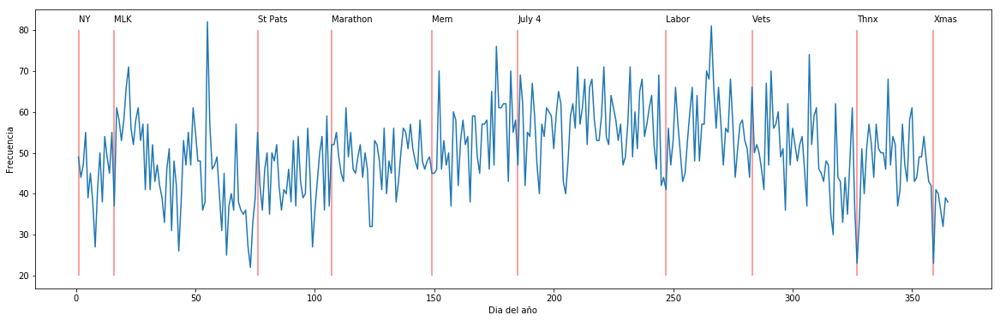

In [11]:
# Se crean los datos para el plotting
data['Day_of_year'] = data.Date.dt.dayofyear
data_holidays = data[data.Year == 2017].groupby(['Day_of_year']).size().reset_index(name='counts')

# Fechas de días festivos más importantes enfocadas en 2017
holidays = pd.Series(['2017-01-01', # Año nuevo
                     '2017-01-16', # MLK day
                     '2017-03-17', # St. Patrick's Day
                     '2017-04-17', # Boston marathon
                     '2017-05-29', # Memorial Day
                     '2017-07-04', # Dia de la Independencia
                     '2017-09-04', # Labor day
                     '2017-10-10', # Veterans Day
                     '2017-11-23', # Dia de accion de gracias
                     '2017-12-25']) # Navidad
                      
holidays = pd.to_datetime(holidays).dt.dayofyear
holidays_names = ['NY', 'MLK', 'St Pats', 'Marathon', 'Mem', 'July 4', 'Labor', 'Vets', 'Thnx', 'Xmas']
                      
import datetime as dt

# Plotting de crimenes y dias festivos
fig, ax = plt.subplots(figsize=(20, 6))
sns.lineplot(x='Day_of_year', y='counts', ax=ax, data=data_holidays)

plt.xlabel('Dia del año')
plt.ylabel('Frecuencia')
plt.vlines(holidays, 20, 80, alpha=0.5, color='r')

for i in range(len(holidays)):
    plt.text(x=holidays[i], y=82, s=holidays_names[i])

Resulta interesante descubrir que, para el año 2017, en gran parte de las fechas festivas (Año Nuevo, Martin Luter King Jr., Marathon de Boston, Memorial Day, Día de la Independencia, Dia del Trabajo, Día de Acción de Gracias, y Navidad) no existen picos de crímenes en el gráfico, además, para los días de Martin Luther King Jr., Día de acción de gracias, y Navidad, los crímenes se redujeron drásticamente respecto a otras fechas.

Esto indica que -al menos en Boston, 2017- no se presentó la teoría sobre la tendencia positiva de crímenes en festividades. Para descubrir en detalle lo que ocurre, será necesario analizar otros años y días festivos, en general, se necesita analizar más datos, de igual manera, pueden existir otros factores que influyan como la cultura, hábitos, los distritos del BPD más activos, etcétera.

## ¿Dónde ocurren los crímenes más graves?
Se puede emplear las columnas Lat y Long para graficar la localización de los crímenes en Boston.
A continuación, se empleará un diagrama de dispersión para explorar la existencia de agrupamiento de puntos, si lo hay, significará que en esas coordenadas se concentra la mayor actividad criminal de la ciudad.

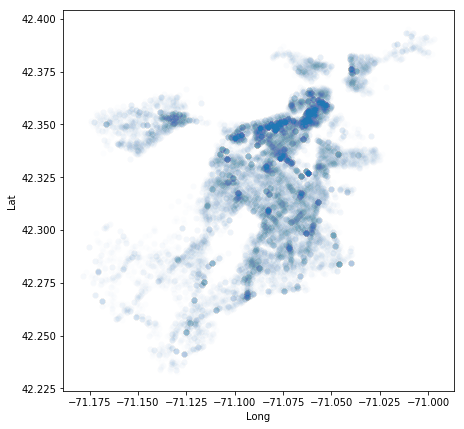

In [12]:
# Plotting de un diagrama de dispersión
plt.figure(figsize=(7, 7))
sns.scatterplot(x='Long', y='Lat', alpha=0.01, data=data)

En efecto, se encuentran grupos de alta incidencia criminalística, luego de comprobarlo, procederemos a mejorar la representación con el fin de facilitar la localización respecto a su mapa.

El dataset contiene una columna `District` (inicialmente `DISTRICT`) que registra una zona de un distrito policial, se emplea esta información para separar los grupos de puntos.

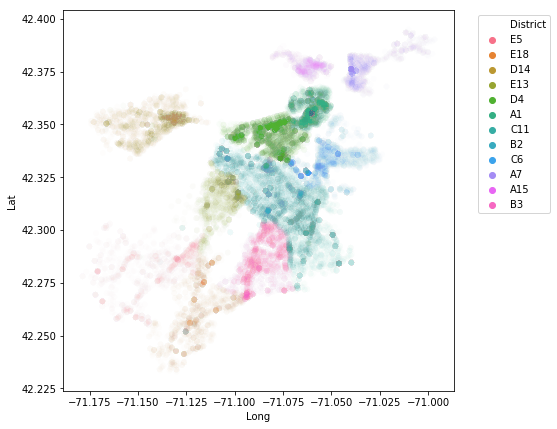

In [13]:
# Plotting de los distritos de la ciudad
plt.figure(figsize=(7, 7))
sns.scatterplot(x='Long', y='Lat', hue='District', alpha=0.01, data=data)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

Los distritos D4 y A1 contienen la mayor cantidad de puntos acumulados de ofensas criminales graves. Las calles son *650 Harrison Avenue* para el D4, y *40 New Sudbury Street* para el A1. Estas calles pertenecen a la zona central de Boston con mayor concurrencia de negocios y edificios públicos.

Por último, se grafica un mapa interactivo.
Si se encuentra en GitHub para verlo es necesario ir al siguiente enlace a un visualizador externo [nbviewer](https://nbviewer.jupyter.org/github/johan-apo/projects-python/blob/master/eda-crimes-in-boston.ipynb).

In [14]:
# Se crea un mapa que expone el indice criminalistico
crime_map = folium.Map(location=[42.3125, -71.0875], tiles='Stamen Toner', zoom_start=11)

# Añadir los datos para el heatmap
data_heatmap = data[data.Year == 2017]
data_heatmap = data[['Lat', 'Long']]
data_heatmap = data.dropna(axis=0, subset=['Lat', 'Long'])
data_heatmap = [[row['Lat'], row['Long']] for index, row in data_heatmap.iterrows()]
HeatMap(data_heatmap, radius=10).add_to(crime_map)

crime_map

## Conclusión
Luego de trabajar con fechas, ubicaciones, tiempo y categorías del dataset provisto por el BPD se concluye que:
- El crimen grave con mayor incidencia es `Larceny` que es la apropiación de bienes ajenos sin requerir la fuerza, seguido por `Larceny from a vehicle` es decir robo desde un vehpiculo, y luego `Aggravated Assault` o asalto agravado. Por el otro lado, los homicidios son muy poco frecuentes.
- Respecto al tiempo se encontró que después del mediodía las ofensas criminales aumentaban y llegaba a su punto máximo a las 18:00.
- A la escala de semana, los días viernes tuvieron mayor frecuencia de crímenes, seguido por los martes. Los domingos demuestra ser el día de menor incidencia.
- A lo largo del año 2017, el mes de agosto presentó la mayor actividad criminal. Se observa una forma de campana después de febrero hasta noviembre, salvo el mes de enero que produce irregularidad en el gráfico.
- Se descubrió que no existe una correlación positiva entre días festivos y la actividad criminal, por el contrario, los días festivos sugieren menores crímenes, en especial Navidad y el Día de Acción de Gracias.
- La actividad criminal se concentra en el centro de la ciudad de Boston donde reside la mayor actividad comercial, en específico, los distritos D4 *640 Harrison Avenue* y A1 con calle *40 New Sudbury Street*.

## Recomendaciones
Para próximas investigaciones se sugiere emplear un rango de tiempo mayor para precisar y generalizar los comportamientos.
Trabajar en el futuro con el UCR Part Two podría ser interesante dado que este contiene información sobre crímenes por drogas. Es recomendable emplear otros datasets de Boston como la demografía del territorio, o el clima para descubrir si existen nuevos insights sobre los crímenes.